## 3. Regression: Optimization of Long-Term Correction of Wind Data Using Regression Models

**Assignment Description**

In this assignment, you will work with realistic data from the wind industry. Vestas, a leading global company in wind energy, is interested in optimizing their methods for generating long-term corrected (LTC) wind data, which are used for planning the locations of new wind farms.
 
You will have access to two types of time series data:
 1) Mast time series data that represent the wind conditions at a specific location based on measurements from a wind measuring mast. These data usually cover a period of 1-4 years.
 2) Meso time series data that are based on weather measurement models and cover more than 20 years. While these data are less precise and don't exactly match the specific location, they provide a longer historical context.

Note that the mast data for this project is significantly longer than "typical" mast data. This allows cutting the data into training and test sets (or training, validation and test sets). Each set should cover all four seasons.

Your task is to develop a model using regression techniques that can generate LTC wind data. This LTC time series should be long, like the meso time series, but also give an accurate description of the wind conditions at the specific location.

**Objectives and Purpose**
 
The purpose of the assignment is to assess whether regression could be used instead of neural networks, which could potentially save time and money as it is generally quicker to perform a regression than to train a neural network. And the main objective is thus to develop a regression model that can generate LTC time series that are both accurate and cost-effective.

**Requirements**
1. **Data preprocessing:** You must handle large datasets and perform necessary data preprocessing tasks. This includes dealing with missing values, handling outliers, and scaling data appropriately for the chosen regression technique.

    a. Consider the appropriate intervals for wind speeds and wind directions. No negative wind speeds are allowed, and wind directions should be in an appropriate interval (e.g. [0; 360[ degrees).

    b. Select which ws / wd signals to use. Signals at higher altitude are generally better, but it is even more important to have proper coverage of all seasons.

    c. Find the meso-signals closest in height to the mast-data-signal you are using. Or interpolate the values between 2 or more meso-signals to get the values at the exact mast-signal-height.

    d. Convert the mast data from DK time to UTC time (corresponding to the time zone used in the meso data). Remember to account for summer-time in DK.
    
    e. Resample the mast dataset to have the same frequency as the meso data. The meso data has one record for each hour, the mast data has one record for each 10 min.

        i. Note: You should not convert the ws / wd signals to vector-quantities and use those for the resampling. Resample the ws and wd signal individually instead. The turbines “yaw” to always point toward the incoming wind, so the interesting value is the wind speed and not the wind velocity.  
        ii. Be careful when resampling the wind directions. You don’t want the average of 0 degrees and 359 degrees to become ~180 degrees :-)

    f. Find the overlapping timestamps between the meso data and the resampled mast data. You only want to consider data in this overlapping time period in your training.

2. **Exploratory analysis:** You must do an exploratory analysis of the data. This includes presenting the data in tables and graphs, study and describe features of interest, as well as correlation analysis. Wind speeds typically follow a Weibull-distributions. Try fitting a Weibull distribution to the mast data, the resampled mast data and the meso-data. 
3. **Model Development:** Use appropriate machine learning principles and methodologies, including model training and testing and perhaps validation, cross-validation, and leave-one-out. You should apply and interpret regression models effectively for this task.
4. **Model Evaluation:** Evaluate the developed model using appropriate metrics such as Mean Squared Error (MSE), R-squared (R²), etc. The evaluation should give an indication of the usefulness of your model in predicting wind conditions accurately. 
In addition to calculating the above metric for your predicted time series, also consider comparing the distributions of the wind speeds in the predicted and the actual (resampled) mast data. That is, calculate the Weibull A- and k-parameters for both distributions, and find the error in these between your fit and the true data. "Error-in-A" and "Error-in-k" are the most used quantities to evaluate the long term correction process in the wind industry :-)
5. **Documentation and Presentation:** Clearly document the steps, methodologies, and tools you used during the process. Present the results of your model in a clear and effective manner. This documentation should be comprehensive enough for someone to replicate your process and understand your results. Hand-in as one Jupyter Notebook.


**Some additional comments**

They (Vestas) have also tried running their own LTC algorithm on some of the data (they chose the 77m wind speed and wind direction signals from the Risø dataset), and this yielded good results. They assumed that the data was in Danish time, so they believe that is the case.

As you can see, there is quite a focus on wind speeds (as they determine the amount of power produced). However, they know that their neural network operates by training on the different components of wind speed separately (meaning training one network on the x-component of the wind and another network on the y-component of the wind) and then combining them at the end. You may consider this method too. They are not sure if it yields better performance than training on wind speed and wind direction separately...but if time permits, give it a go.

**About the data**

The mast datasets are in netCDF format. It's quite easy to work with in Python (not sure if you've used it before?). In one of the folders, a test.py file is included that demonstrate how to load the dataset and access the most relevant mast signals.

The mast data has a measurement frequency of 10 minutes, while the meso data has a frequency of 1 hour. Therefore, you will need to resample the mast data to a 1-hour frequency before you can use it (see requirement 1.e above). Vestas does the same with their data. As mentioned you should be careful when resampling the angles so that the average of 0 degrees (north) and 359 degrees doesn't end up being approximately 180 degrees.

The data is publicly available. You can read more about it here:

*Risø:*

https://gitlab.windenergy.dtu.dk/fair-data/winddata-revamp/winddata-documentation/-/blob/kuhan-master-patch-91815/risoe_m.md

Data: https://data.dtu.dk/articles/dataset/Wind_resource_data_from_the_tall_Ris_met_mast/14153204 (this is the "DOI"-link from the description)


*Børglum:*

https://gitlab.windenergy.dtu.dk/fair-data/winddata-revamp/winddata-documentation/-/blob/kuhan-master-patch-91815/borglum.md

Data: https://data.dtu.dk/articles/dataset/Resource_data_from_the_Borglum_mast/14153231

The two meso datasets come from Vestas' climate library, and the meso data is in UTC time. They don't think you need anything other than the "wind speed" (WSP) and "wind direction" (WDIR) signals. They believe it's most appropriate to either use the height closest to the mast height (for example, if you're using the wind speed signal ws125 and the wind direction signal wd125 from the Risø dataset, you should use WSP120 and WDIR120 from the meso dataset) or use multiple signals and interpolate to the desired height (125m) (see the requirements above).

**Final comments**

In a perfect world, you can do all of the above. The assignment is "free" in the sense that you should give the above a go and do your best. Remember, there is no right answer. This assignment is a real-world machine learning task and not a "made-up" school task. There are software engineers at Vestas working on exactly the same task (albeit with a different dataset, which they arent' allowed to share with us). But try to discuss the problem in your group and distribute the work among you. You can even collaborate with other groups or find inspiration in their approach.

And remember. These portfolio assignments are not meant as "learn stuff in class and apply to assignment" - they are part of the learning process, and not simply a documentation of what you have learned. They should be seen as "learning by doing"-type assignments.

In session 5, we will do a Q/A if you have any questions. But as mentioned, try to give it a go. 

In [1]:
# Importing libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

from scipy import stats

import netCDF4 as nc
from datetime import datetime, timedelta
import plotly.express as px

from scipy.stats import weibull_min
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_squared_error, r2_score

# **Reading Data**

## Mast Data

In [2]:
file_path_risoe = 'data/Risoe/risoe_m_all.nc'
file_paths_borglum = 'data/Borglum/borglum_all.nc'

signals_risoe = ['ws77', 'wd77', 'ws125', 'wd125']
signals_borglum = ['ws32', 'wd32', 'ws10', 'wd10']

base_date_borglum = datetime(1997, 12, 11, 16, 5, 0)
base_date_risoe = datetime(1995, 11, 20, 16, 25, 0)

# Get the Risoe and Borglum dataset:
dataset_mast_risoe = nc.Dataset(file_path_risoe, 'r')
dataset_mast_borglum = nc.Dataset(file_paths_borglum, 'r')

In [3]:
np.array(dataset_mast_risoe.variables['time'])

array([      0,      10,      20, ..., 6370991, 6371001, 6371011],
      dtype=int64)

In [4]:
def is_dst(dt):
    tzinfo = dt.tzinfo
    print(type(tzinfo))
    return bool(tzinfo and tzinfo.dst(dt) != timedelta(0))

In [5]:
# Risoe dataset
# List the variables in the dataset
print("Variables in the netCDF file:")
for var_name in dataset_mast_risoe.variables:
    print(var_name)


time_minutes = np.array(dataset_mast_risoe.variables['time'])

# Convert time values to timestamp strings
mast_risoe = {}
time = []
for minutes in time_minutes:
	time_delta = timedelta(minutes=int(minutes))
	timestamp = base_date_risoe + time_delta
	time.append(timestamp.strftime('%Y-%m-%d %H:%M:%S'))

	

mast_risoe["timestamp"] = np.array(time)
 
print(f"time:\n {mast_risoe['timestamp'][:10]} - {mast_risoe['timestamp'][-1]}")


for signal in signals_risoe:
	mast_risoe[signal] = np.array(dataset_mast_risoe.variables[signal])
	print(f'{signal}:\n {mast_risoe[signal][:10]} - {mast_risoe[signal][-10:-1]}')

Variables in the netCDF file:
time
ws44
ws44_qc
ws77
ws77_qc
ws125
ws125_qc
wd77
wd77_qc
wd125
wd125_qc
t003
t003_qc
t044
t044_qc
t118
t118_qc
td01
td01_qc
rain
rain_qc
press
press_qc
rhum
rhum_qc
grad
grad_qc
time:
 ['1995-11-20 16:25:00' '1995-11-20 16:35:00' '1995-11-20 16:45:00'
 '1995-11-20 16:55:00' '1995-11-20 17:05:00' '1995-11-20 17:15:00'
 '1995-11-20 17:25:00' '1995-11-20 17:35:00' '1995-11-20 17:45:00'
 '1995-11-20 17:55:00'] - 2007-12-31 23:56:00
ws77:
 [3.36 3.05 3.59 3.87 4.74 4.91 4.98 5.39 5.76 5.52] - [8.14 8.71 6.82 7.26 7.24 6.04 6.97 8.17 6.66]
wd77:
 [205. 205. 204. 202. 201. 206. 203. 203. 193. 200.] - [0. 0. 0. 0. 0. 0. 0. 0. 0.]
ws125:
 [3.04 3.17 3.64 3.77 4.28 4.91 5.35 5.58 5.75 5.38] - [nan nan nan nan nan nan nan nan nan]
wd125:
 [208. 214. 209. 209. 212. 213. 210. 206. 207. 205.] - [0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [6]:
data_mast_risoe = pd.DataFrame().from_dict(mast_risoe)
data_mast_risoe = data_mast_risoe.set_index("timestamp", drop=True)
data_mast_risoe.index = pd.to_datetime(data_mast_risoe.index)

data_mast_risoe.head(3)

,ws77,wd77,ws125,wd125
timestamp,,,,
1995-11-20 16:25:00,3.36,205.0,3.04,208.0
1995-11-20 16:35:00,3.05,205.0,3.17,214.0
1995-11-20 16:45:00,3.59,204.0,3.64,209.0


In [7]:
# Borglum dataset
# List the variables in the dataset
print("Variables in the netCDF file:")
for var_name in dataset_mast_borglum.variables:
    print(var_name)


time_minutes = np.array(dataset_mast_borglum.variables['time'])

# Convert time values to timestamp strings
mast_borglum = {}
time = []
for minutes in time_minutes:
	time_delta = timedelta(minutes=int(minutes))
	timestamp = base_date_borglum + time_delta
	time.append(timestamp.strftime('%Y-%m-%d %H:%M:%S'))

mast_borglum["timestamp"] = np.array(time)
 
print(f"time:\n {mast_borglum['timestamp'][:10]} - {mast_borglum['timestamp'][-1]}")


for signal in signals_borglum:
	mast_borglum[signal] = np.array(dataset_mast_borglum.variables[signal])
	print(f'{signal}:\n {mast_borglum[signal][:10]} - {mast_borglum[signal][-10:-1]}')

Variables in the netCDF file:
time
ws32
ws32_qc
ws20
ws20_qc
ws10
ws10_qc
wd10
wd10_qc
wd32
wd32_qc
t002
t002_qc
t30
t30_qc
td10_2
td10_2_qc
td30_10
td30_10_qc
rhum
rhum_qc
grad
grad_qc
press
press_qc
time:
 ['1997-12-11 16:05:00' '1997-12-11 16:15:00' '1997-12-11 16:25:00'
 '1997-12-11 16:35:00' '1997-12-11 16:45:00' '1997-12-11 16:55:00'
 '1997-12-11 17:05:00' '1997-12-11 17:15:00' '1997-12-11 17:25:00'
 '1997-12-11 17:35:00'] - 2001-12-31 23:55:00
ws32:
 [6.95 7.19 7.22 7.69 7.35 6.75 6.62 5.98 5.78 5.95] - [1.57 1.24 1.73 1.87 1.9  1.73 1.83 2.   2.13]
wd32:
 [nan nan nan nan nan nan nan nan nan nan] - [ 80. 111. 140. 152. 174. 173. 160. 163. 173.]
ws10:
 [5.66 5.89 6.1  6.47 6.3  5.69 5.59 4.95 4.58 4.88] - [1.47 2.35 1.6  1.79 1.18 0.95 1.24 1.24 1.11]
wd10:
 [267. 275. 277. 284. 292. 294. 290. 297. 311. 316.] - [125. 129. 156. 187. 188. 104. 110. 147. 162.]


In [8]:
data_mast_borglum = pd.DataFrame().from_dict(mast_borglum)

data_mast_borglum = data_mast_borglum.set_index("timestamp", drop=True)
data_mast_borglum.index = pd.to_datetime(data_mast_borglum.index)

data_mast_borglum.head(3)

,ws32,wd32,ws10,wd10
timestamp,,,,
1997-12-11 16:05:00,6.95,NaN,5.66,267.0
1997-12-11 16:15:00,7.19,NaN,5.89,275.0
1997-12-11 16:25:00,7.22,NaN,6.10,277.0


## Meso Data

In [9]:
data_meso_risoe = pd.read_csv("data/Risoe/meso_Risoe.csv")
data_meso_risoe = data_meso_risoe[['TIMESTAMP', 'WSP060', 'WSP080', 'WSP100', 'WSP120', 'WSP140', 'WSP160', 'WSP180', 'WSP200', 'WSP220', 'WDIR060', 'WDIR080', 'WDIR100', 'WDIR120', 'WDIR140', 'WDIR160', 'WDIR180', 'WDIR200', 'WDIR220']]

data_meso_borglum = pd.read_csv("data/Borglum/meso_Borglum.csv")
data_meso_borglum = data_meso_borglum[['TIMESTAMP', 'WSP060', 'WSP080', 'WSP100', 'WSP120', 'WSP140', 'WSP160', 'WSP180', 'WSP200', 'WSP220', 'WDIR060', 'WDIR080', 'WDIR100', 'WDIR120', 'WDIR140', 'WDIR160', 'WDIR180', 'WDIR200', 'WDIR220']]

In [10]:
data_meso_risoe = data_meso_risoe.rename(columns={"TIMESTAMP":"timestamp"}).set_index("timestamp", drop=True)
data_meso_risoe.index = pd.to_datetime(data_meso_risoe.index)

In [11]:
data_meso_risoe.shape

(204288, 18)

In [13]:
data_meso_risoe.head(3)

,WSP060,WSP080,WSP100,WSP120,WSP140,WSP160,WSP180,WSP200,WSP220,WDIR060,WDIR080,WDIR100,WDIR120,WDIR140,WDIR160,WDIR180,WDIR200,WDIR220
timestamp,,,,,,,,,,,,,,,,,,
2001-06-10 15:00:00,1.71,1.77,1.82,1.88,1.95,2.02,2.12,2.23,2.35,92.76,94.47,96.71,99.34,102.54,106.13,110.31,115.34,119.83
2001-06-10 16:00:00,0.32,0.38,0.43,0.48,0.53,0.58,0.63,0.70,0.76,153.00,158.45,162.63,166.00,168.85,171.30,173.44,175.35,176.98
2001-06-10 17:00:00,0.92,0.93,0.93,0.93,0.93,0.92,0.92,0.91,0.91,314.87,313.49,312.13,310.79,309.37,307.87,306.32,304.70,303.05


In [12]:
data_meso_borglum = data_meso_borglum.rename(columns={"TIMESTAMP":"timestamp"}).set_index("timestamp", drop=True)
data_meso_borglum.index = pd.to_datetime(data_meso_borglum.index)

In [13]:
data_meso_borglum.head(3)

,WSP060,WSP080,WSP100,WSP120,WSP140,WSP160,WSP180,WSP200,WSP220,WDIR060,WDIR080,WDIR100,WDIR120,WDIR140,WDIR160,WDIR180,WDIR200,WDIR220
timestamp,,,,,,,,,,,,,,,,,,
2000-01-01 07:00:00,9.12,9.67,10.17,10.63,11.09,11.55,12.00,12.45,12.89,193.41,194.42,195.49,196.61,197.86,199.19,200.58,202.12,203.56
2000-01-01 08:00:00,9.10,9.62,10.11,10.56,11.01,11.46,11.92,12.39,12.87,191.73,192.50,193.32,194.17,195.16,196.24,197.43,198.82,200.15
2000-01-01 09:00:00,9.13,9.64,10.05,10.37,10.77,11.24,11.71,12.18,12.65,206.20,206.94,207.60,208.19,209.12,210.27,211.53,213.00,214.41


In [14]:
data_meso_borglum.shape

(204720, 18)

# **Preprocessing**

## Dealing with missing values and outliers

### missing values in mast

In [15]:
(data_mast_risoe.isna().sum() / len(data_mast_risoe))*100 # As percentage

ws77      1.074545
wd77      0.087211
ws125    13.790524
wd125    11.065171
dtype: float64

In [16]:
(data_mast_borglum.isna().sum() / len(data_mast_borglum))*100

ws32    0.580839
wd32    3.472788
ws10    2.841543
wd10    0.004240
dtype: float64

- **Linear Interpolation (method='linear'):** This method assumes a linear relationship between data points. It fills missing values with values that form a straight line between the non-missing values.

- **Time-based Interpolation (method='time'):** This method considers the time index of the data. It performs linear interpolation based on the time difference between data points.

In [17]:
data_mast_risoe = data_mast_risoe.interpolate(method="time")

In [18]:
data_mast_borglum["wd32"].iat[0] = data_mast_borglum["wd10"].iat[0]
# starting columns in borglum data is NaN, so time interpolation can not fill the values
# To fix this we manually add a value to the first timestamp of borglum data using value from a lower point at same timestamp

data_mast_borglum = data_mast_borglum.interpolate(method="time")

In [19]:
data_mast_risoe.isna().sum().sum()

0

In [20]:
data_mast_borglum.isna().sum().sum()



0

### missing values in meso

In [21]:
print("nan in Risoe meso : ", data_meso_risoe.isna().sum().sum())
print("nan in borglum meso : ", data_meso_borglum.isna().sum().sum())

nan in Risoe meso :  0
nan in borglum meso :  0


In [23]:
data_mast_borglum.head(100)

,ws32,wd32,ws10,wd10
timestamp,,,,
1997-12-11 16:05:00,6.95,267.000000,5.66,267.0
1997-12-11 16:15:00,7.19,266.970700,5.89,275.0
1997-12-11 16:25:00,7.22,266.941400,6.10,277.0
1997-12-11 16:35:00,7.69,266.912099,6.47,284.0
1997-12-11 16:45:00,7.35,266.882799,6.30,292.0
...,...,...,...,...
1997-12-12 07:55:00,7.99,264.216484,7.21,34.0
1997-12-12 08:05:00,8.49,264.187184,7.44,38.0
1997-12-12 08:15:00,7.69,264.157884,6.70,38.0


## General info

In [24]:
data_mast_risoe.describe()

,ws77,wd77,ws125,wd125
count,628359.000000,628359.000000,628359.000000,628359.000000
mean,6.848292,193.174145,6.910190,171.622951
std,3.329337,98.200970,4.146217,102.920102
min,0.000000,0.000000,0.000000,0.000000
25%,4.520000,119.000000,4.040000,100.000000
50%,6.600000,209.000000,7.090000,191.000000
75%,8.830000,274.000000,9.750000,252.000000
max,32.170000,360.000000,34.300000,360.000000


In [25]:
data_mast_borglum.describe()

,ws32,wd32,ws10,wd10
count,212279.000000,212279.000000,212279.000000,212279.000000
mean,6.679011,185.339130,5.569163,182.720780
std,3.398688,89.174217,3.129016,91.017956
min,0.120000,0.000000,0.100000,0.000000
25%,4.270000,119.000000,3.260000,113.000000
50%,6.100000,191.000000,5.070000,188.000000
75%,8.660000,261.000000,7.430000,262.000000
max,26.260000,360.000000,23.550000,360.000000


In [25]:
data_meso_risoe.describe()

,WSP060,WSP080,WSP100,WSP120,WSP140,WSP160,WSP180,WSP200,WSP220,WDIR060,WDIR080,WDIR100,WDIR120,WDIR140,WDIR160,WDIR180,WDIR200,WDIR220
count,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.000000,204288.00000,204288.000000
mean,6.389825,6.951803,7.418863,7.812332,8.148081,8.440046,8.700832,8.922643,9.134629,202.028200,202.551547,202.916097,203.372662,203.805051,204.374172,204.975849,205.55740,206.060986
std,2.919467,3.118094,3.302216,3.475854,3.641225,3.802506,3.958246,4.104478,4.252616,88.865439,89.264637,89.581096,89.803853,89.973229,90.062044,90.122931,90.15932,90.213659
min,0.020000,0.030000,0.040000,0.060000,0.040000,0.010000,0.010000,0.030000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,0.000000,0.00000,0.000000
25%,4.330000,4.750000,5.070000,5.310000,5.490000,5.630000,5.760000,5.840000,5.920000,133.830000,133.810000,133.770000,133.820000,133.990000,134.277500,134.680000,135.10000,135.487500
50%,6.140000,6.760000,7.260000,7.690000,8.030000,8.330000,8.580000,8.780000,8.970000,217.440000,218.170000,218.820000,219.540000,220.290000,221.195000,222.070000,222.93000,223.800000
75%,8.180000,8.870000,9.500000,10.060000,10.550000,10.990000,11.390000,11.740000,12.070000,272.510000,273.560000,274.330000,275.030000,275.610000,276.250000,276.790000,277.33000,277.760000
max,24.240000,26.130000,27.700000,29.000000,30.130000,31.110000,32.030000,32.830000,33.610000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.000000,360.00000,360.000000


In [26]:
data_meso_borglum.describe()

,WSP060,WSP080,WSP100,WSP120,WSP140,WSP160,WSP180,WSP200,WSP220,WDIR060,WDIR080,WDIR100,WDIR120,WDIR140,WDIR160,WDIR180,WDIR200,WDIR220
count,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000,204720.000000
mean,7.093154,7.624232,8.054655,8.408219,8.706416,8.963089,9.190908,9.383750,9.567239,191.469883,192.443505,193.288919,194.070294,194.781838,195.459674,196.028634,196.577089,197.213717
std,3.220443,3.428167,3.613243,3.782221,3.938431,4.087727,4.230972,4.365846,4.501635,91.272215,91.184651,91.100350,91.024980,90.960629,90.901824,90.863521,90.815319,90.757674
min,0.040000,0.040000,0.060000,0.070000,0.060000,0.050000,0.050000,0.050000,0.040000,0.000000,0.010000,0.000000,0.000000,0.010000,0.000000,0.020000,0.000000,0.000000
25%,4.830000,5.200000,5.480000,5.690000,5.840000,5.960000,6.050000,6.120000,6.180000,119.920000,120.850000,121.680000,122.460000,123.150000,123.780000,124.460000,125.020000,125.690000
50%,6.760000,7.320000,7.790000,8.170000,8.470000,8.730000,8.950000,9.130000,9.290000,204.070000,205.970000,207.710000,209.240000,210.650000,212.020000,213.230000,214.440000,215.620000
75%,8.980000,9.660000,10.240000,10.750000,11.200000,11.600000,11.970000,12.290000,12.600000,268.160000,268.750000,269.190000,269.612500,270.000000,270.320000,270.640000,270.880000,271.180000
max,31.110000,32.830000,34.230000,35.700000,36.850000,37.650000,38.380000,39.010000,39.620000,360.000000,360.000000,360.000000,359.990000,360.000000,359.990000,360.000000,360.000000,360.000000


- All the wind direction are in within the range
- no negative values in wind direction or speed

## Checking outliers

In [27]:
def outliers_checker(df):
    numeric_features = df.select_dtypes(include="number")


    for column in numeric_features.columns:
        q1 = numeric_features[column].quantile(0.25)
        q3 = numeric_features[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        outliers_count= len(df[(df[column] < lower_bound) | (df[column] > upper_bound)])
        print("Before replacing : ", column, "\t", outliers_count)


        df[column] = df[column].clip(lower_bound, upper_bound, axis=0)

        outliers_count_after= len(df[(df[column] < lower_bound) | (df[column] > upper_bound)])
        print("After replacing : ", column, "\t", outliers_count_after)
        print()

    return df

In [28]:
data_mast_risoe = outliers_checker(data_mast_risoe)

Before replacing :  ws77 	 9266
After replacing :  ws77 	 0

Before replacing :  wd77 	 0
After replacing :  wd77 	 0

Before replacing :  ws125 	 2996
After replacing :  ws125 	 0

Before replacing :  wd125 	 0
After replacing :  wd125 	 0



In [29]:
data_mast_borglum = outliers_checker(data_mast_borglum)

Before replacing :  ws32 	 3866
After replacing :  ws32 	 0

Before replacing :  wd32 	 0
After replacing :  wd32 	 0

Before replacing :  ws10 	 3715
After replacing :  ws10 	 0

Before replacing :  wd10 	 0
After replacing :  wd10 	 0



In [30]:
data_meso_risoe = outliers_checker(data_meso_risoe)

Before replacing :  WSP060 	 2462
After replacing :  WSP060 	 0

Before replacing :  WSP080 	 2314
After replacing :  WSP080 	 0

Before replacing :  WSP100 	 1940
After replacing :  WSP100 	 0

Before replacing :  WSP120 	 1628
After replacing :  WSP120 	 0

Before replacing :  WSP140 	 1334
After replacing :  WSP140 	 0

Before replacing :  WSP160 	 1141
After replacing :  WSP160 	 0

Before replacing :  WSP180 	 992
After replacing :  WSP180 	 0

Before replacing :  WSP200 	 867
After replacing :  WSP200 	 0

Before replacing :  WSP220 	 782
After replacing :  WSP220 	 0

Before replacing :  WDIR060 	 0
After replacing :  WDIR060 	 0

Before replacing :  WDIR080 	 0
After replacing :  WDIR080 	 0

Before replacing :  WDIR100 	 0
After replacing :  WDIR100 	 0

Before replacing :  WDIR120 	 0
After replacing :  WDIR120 	 0

Before replacing :  WDIR140 	 0
After replacing :  WDIR140 	 0

Before replacing :  WDIR160 	 0
After replacing :  WDIR160 	 0

Before replacing :  WDIR180 	 0
Af

In [30]:
data_meso_borglum = outliers_checker(data_meso_borglum)

Before replacing :  WSP060 	 3140
After replacing :  WSP060 	 0

Before replacing :  WSP080 	 2834
After replacing :  WSP080 	 0

Before replacing :  WSP100 	 2489
After replacing :  WSP100 	 0

Before replacing :  WSP120 	 2121
After replacing :  WSP120 	 0

Before replacing :  WSP140 	 1836
After replacing :  WSP140 	 0

Before replacing :  WSP160 	 1593
After replacing :  WSP160 	 0

Before replacing :  WSP180 	 1380
After replacing :  WSP180 	 0

Before replacing :  WSP200 	 1243
After replacing :  WSP200 	 0

Before replacing :  WSP220 	 1150
After replacing :  WSP220 	 0

Before replacing :  WDIR060 	 0
After replacing :  WDIR060 	 0

Before replacing :  WDIR080 	 0
After replacing :  WDIR080 	 0

Before replacing :  WDIR100 	 0
After replacing :  WDIR100 	 0

Before replacing :  WDIR120 	 0
After replacing :  WDIR120 	 0

Before replacing :  WDIR140 	 0
After replacing :  WDIR140 	 0

Before replacing :  WDIR160 	 0
After replacing :  WDIR160 	 0

Before replacing :  WDIR180 	 0

## Data Scaling 

b. Select which ws / wd signals to use. Signals at higher altitude are generally better, but it is even more important to have proper coverage of all seasons.

c. Find the meso-signals closest in height to the mast-data-signal you are using. Or interpolate the values between 2 or more meso-signals to get the values at the exact mast-signal-height.

- mast data from height 125 for risoe and 32 for borglum
- for meso, we will use closest height for now, if results are not satisfactory we will try to interpolate
- so, for risoe meso data height of 120 and for borglum 60

In [31]:
data_mast_risoe = data_mast_risoe[['ws125', 'wd125']]
data_mast_borglum = data_mast_borglum[['ws32', 'wd32']]

In [32]:
data_meso_risoe = data_meso_risoe[['WSP120', 'WDIR120']]
data_meso_borglum = data_meso_borglum[['WSP060', 'WDIR060']]

d. Convert the mast data from DK time to UTC time (corresponding to the time zone used in the meso data). Remember to account for summer-time in DK.

In [33]:
data_mast_risoe.head(3)

,ws125,wd125
timestamp,,
1995-11-20 16:25:00,3.04,208.0
1995-11-20 16:35:00,3.17,214.0
1995-11-20 16:45:00,3.64,209.0


In [34]:
data_mast_risoe.index = data_mast_risoe.index.tz_localize('UTC')
data_mast_borglum.index = data_mast_borglum.index.tz_localize('UTC')

data_meso_risoe.index = data_meso_risoe.index.tz_localize('UTC')
data_meso_borglum.index = data_meso_borglum.index.tz_localize('UTC')

e. Resample the mast dataset to have the same frequency as the meso data. The meso data has one record for each hour, the mast data has one record for each 10 min.

In [35]:
def circular_mean(series):
    radians = series.apply(lambda x: x if x <= 180 else x - 360).apply(lambda x: np.deg2rad(x))
    mean_radians = np.arctan2(np.sin(radians).mean(), np.cos(radians).mean())
    mean_degrees = np.rad2deg(mean_radians)
    return mean_degrees if mean_degrees >= 0 else mean_degrees + 360

# cirular mean for wind direction

In [37]:
# Resampling wind speed to hour using simple mean
mast_data_resampled_ws = data_mast_risoe["ws125"].resample("1H").mean().interpolate()
mast_data_resampled_wd = data_mast_risoe['wd125'].resample('1H').apply(circular_mean).interpolate()

data_mast_risoe_resampled = pd.DataFrame({'ws125': mast_data_resampled_ws, 'wd125': mast_data_resampled_wd})

In [38]:
data_mast_risoe_resampled

,ws125,wd125
timestamp,,
1995-11-20 16:00:00+00:00,3.405000,209.999314
1995-11-20 17:00:00+00:00,5.208333,208.833160
1995-11-20 18:00:00+00:00,6.125000,208.833321
1995-11-20 19:00:00+00:00,7.463333,205.499924
1995-11-20 20:00:00+00:00,9.190000,204.666670
...,...,...
2007-12-31 19:00:00+00:00,0.000000,0.000000
2007-12-31 20:00:00+00:00,0.000000,0.000000
2007-12-31 21:00:00+00:00,0.000000,0.000000


In [39]:
# Resampling wind speed to hour using simple mean
mast_data_resampled_ws = data_mast_borglum["ws32"].resample("1H").mean().interpolate()
mast_data_resampled_wd = data_mast_borglum["wd32"].resample('1H').apply(circular_mean).interpolate()

data_mast_borglum_resampled = pd.DataFrame({'ws32': mast_data_resampled_ws, 'wd32': mast_data_resampled_wd})

In [40]:
data_mast_borglum_resampled

,ws32,wd32
timestamp,,
1997-12-11 16:00:00+00:00,7.191667,266.926750
1997-12-11 17:00:00+00:00,5.925000,266.750949
1997-12-11 18:00:00+00:00,4.295000,266.575148
1997-12-11 19:00:00+00:00,3.340000,266.399347
1997-12-11 20:00:00+00:00,3.688333,266.223546
...,...,...
2001-12-31 19:00:00+00:00,3.265000,324.167518
2001-12-31 20:00:00+00:00,2.093333,343.663164
2001-12-31 21:00:00+00:00,2.753333,36.960202


f. Find the overlapping timestamps between the meso data and the resampled mast data. You only want to consider data in this overlapping time period in your training.

In [42]:
data_risoe_combined = data_mast_risoe_resampled.join(data_meso_risoe, how="inner")
print(data_risoe_combined.shape)

data_risoe_combined = data_risoe_combined.reset_index()

(70073, 4)


In [43]:
data_risoe_combined.head(3)

,timestamp,ws125,wd125,WSP120,WDIR120
0,2000-01-01 07:00:00+00:00,8.593333,187.666603,6.58,211.28
1,2000-01-01 08:00:00+00:00,7.775000,185.166366,7.18,207.50
2,2000-01-01 09:00:00+00:00,7.633333,194.996286,7.74,206.93


In [44]:
data_borglum_combined = data_mast_borglum_resampled.join(data_meso_borglum, how="inner")
print(data_borglum_combined.shape)

data_mast_borglum_combined = data_borglum_combined.reset_index()

(17537, 4)


In [45]:
data_borglum_combined.head(3)

,ws32,wd32,WSP060,WDIR060
timestamp,,,,
2000-01-01 07:00:00+00:00,7.720000,182.500025,9.12,193.41
2000-01-01 08:00:00+00:00,7.961667,179.166535,9.10,191.73
2000-01-01 09:00:00+00:00,8.148333,178.833228,9.13,206.20


# **Exploratory Analysis**

In [46]:
fig = px.line(data_risoe_combined, x="timestamp", y=["ws125", "WSP120"])
fig.show()

C:\Users\nepal\AppData\Local\Temp\ipykernel_15072\648704035.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

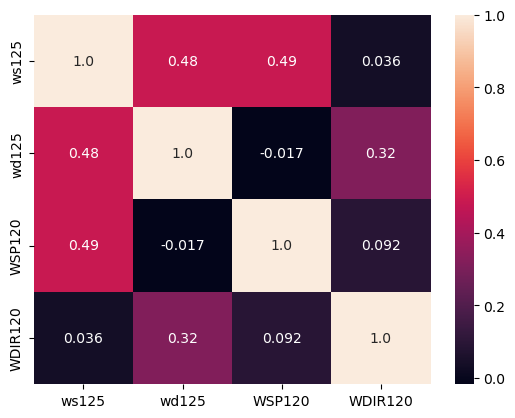

In [47]:
sns.heatmap(data_risoe_combined.corr(), annot=True, fmt=".2")

In [48]:
def plot_weibull(df_col):
    shape, loc, scale = weibull_min.fit(df_col, floc=0)
    weibull_values = weibull_min.pdf(df_col, shape, loc, scale)
    plt.hist(df_col, bins=30, density=True, alpha=0.6, color='g')
    plt.plot(df_col, weibull_values, 'r-', label='Weibull Fit')
    plt.legend()
    plt.show()

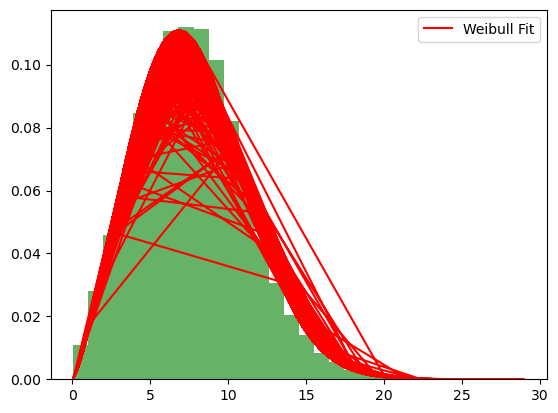

In [49]:
plot_weibull(data_risoe_combined["WSP120"])

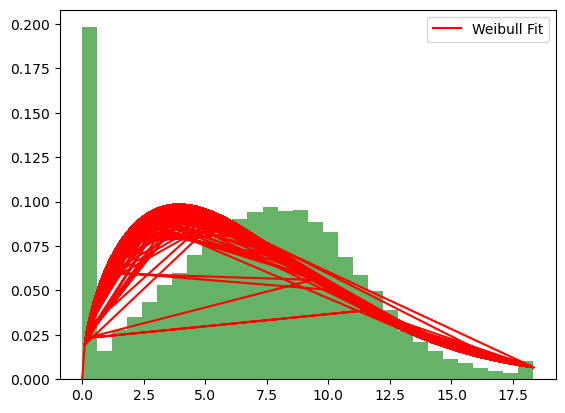

In [51]:
plot_weibull(data_mast_risoe["ws125"])

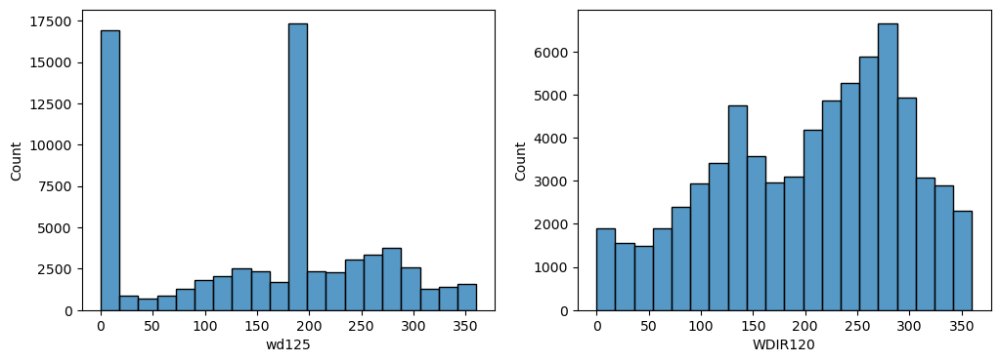

In [52]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(data_risoe_combined['wd125'], bins=20, edgecolor='black', ax=axs[0])
sns.histplot(data_risoe_combined['WDIR120'], bins=20, edgecolor='black', ax=axs[1])
plt.show()

In [53]:
fig = px.line(data_mast_borglum_combined, x="timestamp", y=["ws32", "WSP060"])
fig.show()

/tmp/ipykernel_415956/2697108888.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

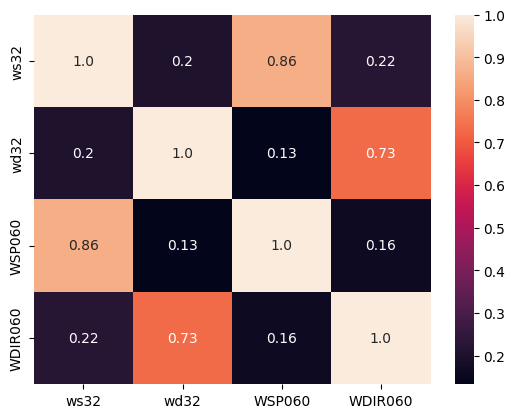

In [52]:
sns.heatmap(data_mast_borglum_combined.corr(), annot=True, fmt=".2")

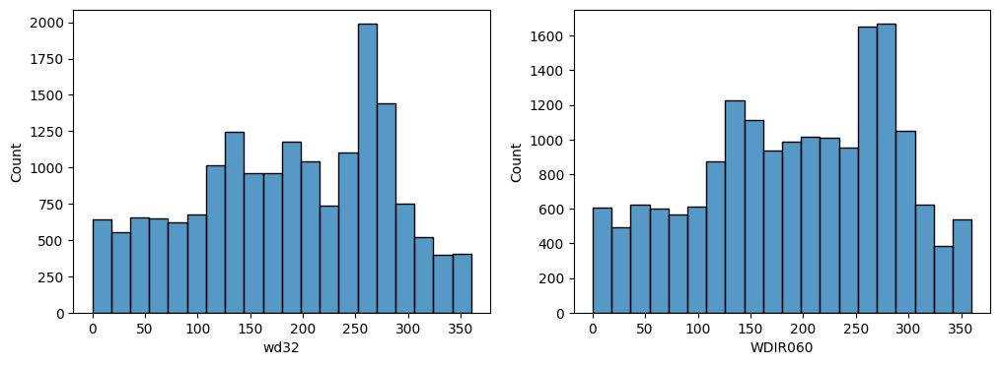

In [53]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(data_borglum_combined['wd32'], bins=20, edgecolor='black', ax=axs[0])
sns.histplot(data_borglum_combined['WDIR060'], bins=20, edgecolor='black', ax=axs[1])
plt.show()

# **Model Development**

### **Borglum data**

In [54]:
data_borglum_combined.reset_index(inplace=True)

In [55]:
data_borglum_combined["ws_difference"] = data_borglum_combined["ws32"] - data_borglum_combined["WSP060"]

data_borglum_combined = data_borglum_combined.drop(columns=["WSP060"])
data_borglum_combined.head(3)

,timestamp,ws32,wd32,WDIR060,ws_difference
0,2000-01-01 07:00:00+00:00,7.720000,182.500025,193.41,-1.400000
1,2000-01-01 08:00:00+00:00,7.961667,179.166535,191.73,-1.138333
2,2000-01-01 09:00:00+00:00,8.148333,178.833228,206.20,-0.981667


In [56]:
# Split the data
split_percentage = 0.8
split_point = data_borglum_combined['timestamp'].quantile(split_percentage)


train_borglum = data_borglum_combined[data_borglum_combined['timestamp'] < split_point]
test_borglum = data_borglum_combined[data_borglum_combined['timestamp'] >= split_point]

In [57]:
X = ["ws32", "wd32", "WDIR060"]

train_borglum_X = train_borglum[X]
test_borglum_X = test_borglum[X]

train_borglum_y = train_borglum["ws_difference"]
test_borglum_y = test_borglum["ws_difference"]

In [58]:
model_wsp = LinearRegression()
model_wsp.fit(train_borglum_X, train_borglum_y)

pred_borglum_y = model_wsp.predict(test_borglum_X)

In [59]:
print('Mean Squared Error for Wind Speed:\t', mean_squared_error(test_borglum_y, pred_borglum_y))
print('R-squared for Wind Speed:\t\t', r2_score(test_borglum_y, pred_borglum_y))

Mean Squared Error for Wind Speed:	 2.754672731585436
R-squared for Wind Speed:		 0.047355430932098486


### **Risoe Data**

In [60]:
data_risoe_combined.reset_index(inplace=True)

In [61]:
data_risoe_combined["ws_difference"] = data_risoe_combined["ws125"] - data_risoe_combined["WSP120"]

data_risoe_combined = data_risoe_combined.drop(columns=["WSP120"])
data_risoe_combined.head(3)

,index,timestamp,ws125,wd125,WDIR120,ws_difference
0,0,2000-01-01 07:00:00+00:00,8.593333,187.666603,211.28,2.013333
1,1,2000-01-01 08:00:00+00:00,7.775000,185.166366,207.50,0.595000
2,2,2000-01-01 09:00:00+00:00,7.633333,194.996286,206.93,-0.106667


In [62]:
# Split the data
split_percentage = 0.8
split_point = data_risoe_combined['timestamp'].quantile(split_percentage)


train_risoe = data_risoe_combined[data_risoe_combined['timestamp'] < split_point]
test_risoe = data_risoe_combined[data_risoe_combined['timestamp'] >= split_point]

In [63]:
X = ["ws125", "wd125", "WDIR120"]

train_risoe_X = train_risoe[X]
test_risoe_X = test_risoe[X]

train_risoe_y = train_risoe["ws_difference"]
test_risoe_y = test_risoe["ws_difference"]

In [64]:
model_wsp_risoe = LinearRegression()
model_wsp_risoe.fit(train_risoe_X, train_risoe_y)

pred_risoe_y = model_wsp_risoe.predict(test_risoe_X)

In [65]:
print('Mean Squared Error for Wind Speed:\t', mean_squared_error(test_risoe_y, pred_risoe_y))
print('R-squared for Wind Speed:\t\t', r2_score(test_risoe_y, pred_risoe_y))

Mean Squared Error for Wind Speed:	 22.5159913056832
R-squared for Wind Speed:		 0.03243592723065947
